# Pytorch3D Tutorial

Contents of tutorial:
* Installing Pytorch3D on Colab
* Mesh Rendering
* Point cloud Rendering

More tutorials available: https://github.com/facebookresearch/pytorch3d

## Installing Pytorch3D


It will be much faster if you switch to GPU runtime (Runtime > Change runtime type > Hardware Accelerator > GPU).

In [1]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith("2.1.") and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{pyt_version_str}"
        ])
        !pip install fvcore iopath
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

In [ ]:
# Set up starter code
!git clone https://github.com/learning3d/assignment1.git
!mv assignment1/* .
!pip install -r requirements.txt

In [ ]:
!pip install --upgrade nbformat

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pytorch3d
import pytorch3d.io
from pytorch3d.vis.plotly_vis import plot_scene
from tqdm.auto import tqdm

import starter.utils

/home/sush/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
# This should print True if you are using your GPU
print("Using GPU:", torch.cuda.is_available())
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")

Using GPU: True


## Rendering a Mesh

To render a mesh, we need 3 components:

* A mesh to render
* A camera to render from
* A renderer (consisting of a rasterizer and shader)

### Setting up a mesh

In [8]:
# Remember: obj = mesh representation
vertices, face_props, text_props = pytorch3d.io.load_obj("data/cow.obj")
faces = face_props.verts_idx

# Think of vertices are the 3D coordinates of each vertex in triangle
# the faces are just indexes assigned to each vertex like (0,1,2) index vertices form one face

In [10]:
# Alternatively, we can use the wrapper from the starter code to load a mesh.
# vertices and faces are tensors
vertices, faces = starter.utils.load_cow_mesh(path="data/cow.obj")

In [11]:
print("Vertices", vertices.shape)
print("Faces", faces.shape)

Vertices torch.Size([2930, 3])
Faces torch.Size([5856, 3])


In [12]:
print("vertices: ", vertices[0])
print("faces: ", faces[0])

faces.min(), faces.max()

vertices:  tensor([ 0.3488, -0.3350, -0.0832])
faces:  tensor([738, 734, 735])


(tensor(0), tensor(2929))

In [13]:
# All Pytorch3D elements need to be batched!
vertices = vertices.unsqueeze(0)  # 1 x N_v x 3
faces = faces.unsqueeze(0)  # 1 x N_f x 3

print("Vertices", vertices.shape)
print("Faces", faces.shape)

Vertices torch.Size([1, 2930, 3])
Faces torch.Size([1, 5856, 3])


In [14]:
texture_rgb = torch.ones_like(vertices) # N X 3
texture_rgb = texture_rgb * torch.tensor([0.7, 0.7, 1])
textures = pytorch3d.renderer.TexturesVertex(texture_rgb) # wrapper which takes in the texture and converts it to the right format for torch3d
print(texture_rgb)
print(texture_rgb.shape)

# Notice that the shape of texture is the same as the shape of vertices

tensor([[[0.7000, 0.7000, 1.0000],
         [0.7000, 0.7000, 1.0000],
         [0.7000, 0.7000, 1.0000],
         ...,
         [0.7000, 0.7000, 1.0000],
         [0.7000, 0.7000, 1.0000],
         [0.7000, 0.7000, 1.0000]]])
torch.Size([1, 2930, 3])


In [15]:
meshes = pytorch3d.structures.Meshes(
    verts=vertices,
    faces=faces,
    textures=textures,
)
meshes = meshes.to(device)  # Move mesh to GPU

In [16]:
print(meshes.verts_padded().shape)
print(meshes.faces_padded().shape)

torch.Size([1, 2930, 3])
torch.Size([1, 5856, 3])


### Setting up a camera

In [17]:
R = torch.eye(3).unsqueeze(0)
T = torch.tensor([[0, 0, 3]])

In [18]:
cameras = pytorch3d.renderer.FoVPerspectiveCameras(
    R=R,
    T=T,
    fov=60,
    device=device,
)

In [19]:
cameras.get_camera_center()
# NOTICE THE -ve below

tensor([[ 0.,  0., -3.]], device='cuda:0')

In [57]:
transform = cameras.get_world_to_view_transform()
transform.get_matrix()

# Notice below that the translation is the 4th row and not the 4th column like normal

# Think of the transformations in this way:
# 1. The camera is always at (0,0,0) in it's own coordinate system
# 2. The world is at (0,0,0) in it's own coordinate system
# 3. Any transform given like above, will define how to go from world to camera

tensor([[[1., 0., 0., 0.],
         [0., 1., 0., 0.],
         [0., 0., 1., 0.],
         [0., 0., 3., 1.]]], device='cuda:0')

### Setting up a Renderer

Rasterizer: Given a pixel, which triangles correspond to it?

Shader: Given triangle, texture, lighting, etc, how should the pixel be colored?

In [21]:
image_size = 512

raster_settings = pytorch3d.renderer.RasterizationSettings(image_size=image_size)
rasterizer = pytorch3d.renderer.MeshRasterizer(
    raster_settings=raster_settings,
)
shader = pytorch3d.renderer.HardPhongShader(device=device)
renderer = pytorch3d.renderer.MeshRenderer(
    rasterizer=rasterizer,
    shader=shader,
)

In [22]:
# Alternatively, use the renderer wrapper
renderer = starter.utils.get_mesh_renderer(image_size=image_size, device=device)

### Render an image

In [23]:
image = renderer(meshes, cameras=cameras)
print(image.shape)

torch.Size([1, 512, 512, 4])


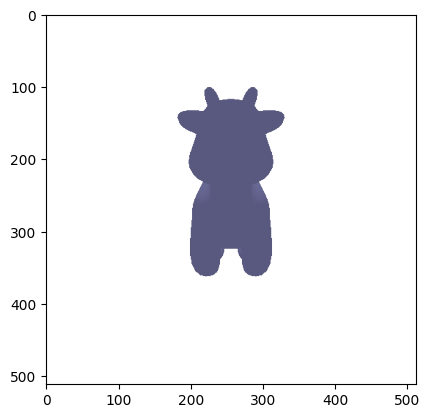

In [ ]:
image = image[0].cpu().numpy() # need to move to cpu for rendering
plt.imshow(image)

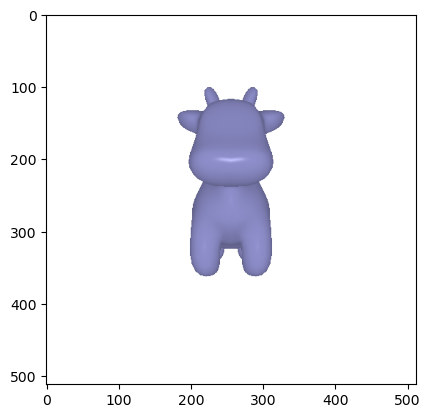

In [24]:
# Note that the light location should be in same location in world frame as the camera is in the world frame
lights = pytorch3d.renderer.PointLights(location=[[0, 0, -3]], device=device)
image = renderer(meshes, cameras=cameras, lights=lights)
plt.imshow(image[0].cpu().numpy())

In [33]:
# good to check where the camera is in the world frame
plot_scene({
    "figure": {
        "Mesh": meshes,
        "Camera": cameras,
    }
})

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'i': array([ 738,  188,  191, ..., 1855, 2927, 2923]),
              'j': array([ 734,  735,  737, ...,  107, 2929,  733]),
              'k': array([ 735,  734,  736, ..., 2929,  733, 2929]),
              'lighting': {'ambient': 0.8,
                           'diffuse': 1.0,
                           'facenormalsepsilon': 1e-06,
                           'fresnel': 0.0,
                           'roughness': 0.5,
                           'specular': 0.0,
                           'vertexnormalsepsilon': 1e-12},
              'name': 'Mesh',
              'scene': 'scene',
              'type': 'mesh3d',
              'vertexcolor': array([[178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    ...,
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ]], dtype=float32),
              'x': array([ 0.348799 ,  0.313132 ,  0.266758 , ..., -0.0132272, -0.01374  ,
                          -0.0137291], dtype=float32),
              'y': array([-0.334989 , -0.399051 ,  0.181628 , ..., -0.0889316, -0.0942759,
                          -0.0795664], dtype=float32),
              'z': array([-0.0832331,  0.881192 ,  0.122726 , ...,  1.04223  ,  1.03402  ,
                           1.04692  ], dtype=float32)},
             {'marker': {'size': 1},
              'name': 'Camera',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([-0.30000001,  0.        ,  0.        ,  0.        ,  0.30000001,
                           0.30000001, -0.30000001, -0.30000001,  0.        ,  0.30000001,
                           0.30000001,  0.        , -0.30000001,  0.        ,  0.        ]),
              'y': array([ 0.22500001,  0.22500001,  0.30000001,  0.22500001,  0.22500001,
                          -0.22500001, -0.22500001,  0.22500001,  0.        ,  0.22500001,
                          -0.22500001,  0.        , -0.22500001,  0.        ,  0.        ]),
              'z': array([-2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001,
                          -2.4000001, -2.4000001, -3.       , -2.4000001, -2.4000001, -3.       ,
                          -2.4000001, -3.       , -2.0999999])}],
    'layout': {'annotations': [{'font': {'size': 16},
                                'showarrow': False,
                                'text': 'figure',
                                'x': 0.5,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'}],
               'scene': {'aspectmode': 'cube',
                         'camera': {'up': {'x': 0.0, 'y': 1.0, 'z': 0.0}},
                         'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
                         'xaxis': {'backgroundcolor': '#fff',
                                   'range': [-1.7179090976715088,
                                             1.7179090976715088],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                                   'zeroline': False},
                         'yaxis': {'backgroundcolor': '#fff',
                                   'range': [-1.6149431467056274,
                                             1.8208750486373901],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                

### Common Rendering Problems

* Nothing is visible
    * Check Camera center
    * Check the Camera world_to_view transform. Try applying the transform to the origin or specific vertices of the mesh.
    * Use the Plotly visualization.
* Lights doesn't seem to do anything
    * Make sure there's no typo (must be `renderer(..., light=lights)` and not `lights=lights`)
    * Check the position of the light



### Transformations

2 ways to apply geometric operations:
* Move the mesh
* Move the camera

In [26]:
relative_rotation = pytorch3d.transforms.euler_angles_to_matrix(
    torch.tensor([0, np.pi/2, 0]), "XYZ"
)
relative_rotation

tensor([[-4.3711e-08,  0.0000e+00,  1.0000e+00],
        [ 0.0000e+00,  1.0000e+00,  0.0000e+00],
        [-1.0000e+00,  0.0000e+00, -4.3711e-08]])

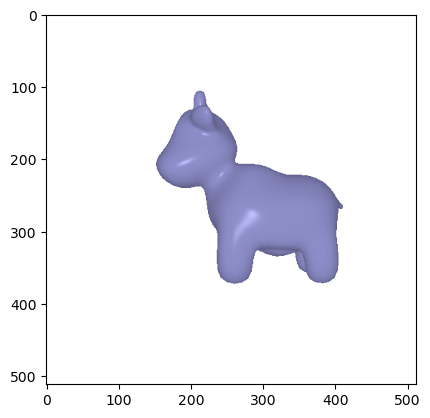

In [27]:
meshes2 = pytorch3d.structures.Meshes(
    verts=vertices @ relative_rotation,
    faces=faces,
    textures=textures,
).to(device)

image = renderer(meshes2, cameras=cameras, lights=lights)
plt.imshow(image[0].cpu().numpy())

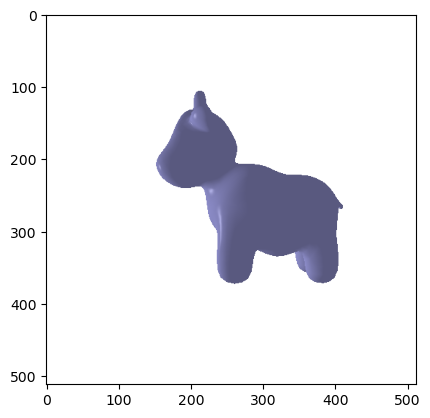

In [29]:
cameras2 = pytorch3d.renderer.FoVPerspectiveCameras(
    R=relative_rotation.unsqueeze(0),
    T=[[0, 0, 3]],
    device=device
)

image = renderer(meshes, cameras=cameras2, lights=lights)
plt.imshow(image[0].cpu().numpy())

In [30]:
transform = cameras2.get_world_to_view_transform()
transform.get_matrix()

tensor([[[-4.3711e-08,  0.0000e+00,  1.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  1.0000e+00,  0.0000e+00,  0.0000e+00],
         [-1.0000e+00,  0.0000e+00, -4.3711e-08,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  3.0000e+00,  1.0000e+00]]],
       device='cuda:0')

In [34]:
plot_scene({
    "Mesh1": {
        "Mesh": meshes,
        "Camera1": cameras,
        "Camera2": cameras2,
    },
    "Mesh2": {
        "Mesh": meshes2,
        "Camera1": cameras,
        "Camera2": cameras2,
    },
}, ncols=2)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'i': array([ 738,  188,  191, ..., 1855, 2927, 2923]),
              'j': array([ 734,  735,  737, ...,  107, 2929,  733]),
              'k': array([ 735,  734,  736, ..., 2929,  733, 2929]),
              'lighting': {'ambient': 0.8,
                           'diffuse': 1.0,
                           'facenormalsepsilon': 1e-06,
                           'fresnel': 0.0,
                           'roughness': 0.5,
                           'specular': 0.0,
                           'vertexnormalsepsilon': 1e-12},
              'name': 'Mesh',
              'scene': 'scene',
              'type': 'mesh3d',
              'vertexcolor': array([[178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    ...,
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ]], dtype=float32),
              'x': array([ 0.348799 ,  0.313132 ,  0.266758 , ..., -0.0132272, -0.01374  ,
                          -0.0137291], dtype=float32),
              'y': array([-0.334989 , -0.399051 ,  0.181628 , ..., -0.0889316, -0.0942759,
                          -0.0795664], dtype=float32),
              'z': array([-0.0832331,  0.881192 ,  0.122726 , ...,  1.04223  ,  1.03402  ,
                           1.04692  ], dtype=float32)},
             {'marker': {'size': 1},
              'name': 'Camera1',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([-0.30000001,  0.        ,  0.        ,  0.        ,  0.30000001,
                           0.30000001, -0.30000001, -0.30000001,  0.        ,  0.30000001,
                           0.30000001,  0.        , -0.30000001,  0.        ,  0.        ]),
              'y': array([ 0.22500001,  0.22500001,  0.30000001,  0.22500001,  0.22500001,
                          -0.22500001, -0.22500001,  0.22500001,  0.        ,  0.22500001,
                          -0.22500001,  0.        , -0.22500001,  0.        ,  0.        ]),
              'z': array([-2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001,
                          -2.4000001, -2.4000001, -3.       , -2.4000001, -2.4000001, -3.       ,
                          -2.4000001, -3.       , -2.0999999])},
             {'marker': {'size': 1},
              'name': 'Camera2',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([-2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001,
                          -2.4000001, -2.4000001, -3.       , -2.4000001, -2.4000001, -3.       ,
                          -2.4000001, -3.       , -2.0999999]),
              'y': array([ 0.22500001,  0.22500001,  0.30000001,  0.22500001,  0.22500001,
                          -0.22500001, -0.22500001,  0.22500001,  0.        ,  0.22500001,
                          -0.22500001,  0.        , -0.22500001,  0.        ,  0.        ]),
              'z': array([ 3.00000101e-01,  1.04907322e-07,  1.04907322e-07,  1.04907322e-07,
                          -2.99999923e-01, -2.99999923e-01,  3.00000101e-01,  3.00000101e-01,
                           1.31134158e-07, -2.99999923e-01, -2.99999923e-01,  1.31134158e-07,
                           3.00000101e-01,  1.31134158e-07,  9.17939076e-08])},
             {'i': array([ 738,  188,  191, ..., 1855, 2927, 2923]),
              'j': array([ 734,  735,  737, ...,  107, 2929,  733]),
              'k': array([ 735,  734,  736, ..., 2929,  733, 2929]),
              'lighting': {'ambient': 0.8,
                           'diffuse': 1.0,
                           'facenormalsepsilon': 1e-06,
                           'fresnel': 0.0,
                           'roughness': 0.5,
                           'specular': 0.0,
                           'vertexnormalsep

In [36]:
num_views = 12
R, T = pytorch3d.renderer.look_at_view_transform(
    dist=3,
    elev=0,
    azim=np.linspace(-180, 180, num_views, endpoint=False),
)
print("R", R.shape) # NOTE: The R and T matrix is now batched because of what we did above
print("T", T.shape)
many_cameras = pytorch3d.renderer.FoVPerspectiveCameras(
    R=R,
    T=T,
    device=device
)
images = renderer(meshes.extend(num_views), cameras=many_cameras, lights=lights)

R torch.Size([12, 3, 3])
T torch.Size([12, 3])


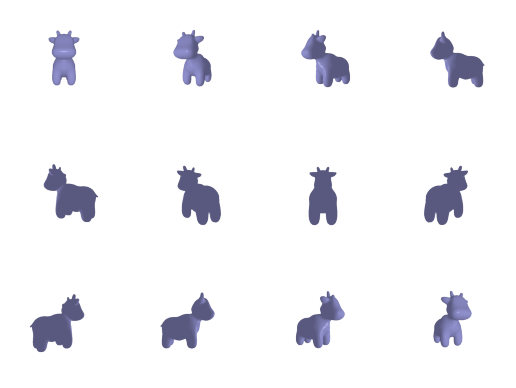

In [37]:
fig, axs = plt.subplots(3, 4)
axs = axs.flatten()
for i, image in enumerate(images):
    ax = axs[i]
    ax.imshow(image.cpu())
    ax.axis("off")

In [38]:
plot_scene({
    "All Views": {
        "Mesh": meshes,
        "Cameras": many_cameras,
    },
})

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'i': array([ 738,  188,  191, ..., 1855, 2927, 2923]),
              'j': array([ 734,  735,  737, ...,  107, 2929,  733]),
              'k': array([ 735,  734,  736, ..., 2929,  733, 2929]),
              'lighting': {'ambient': 0.8,
                           'diffuse': 1.0,
                           'facenormalsepsilon': 1e-06,
                           'fresnel': 0.0,
                           'roughness': 0.5,
                           'specular': 0.0,
                           'vertexnormalsepsilon': 1e-12},
              'name': 'Mesh',
              'scene': 'scene',
              'type': 'mesh3d',
              'vertexcolor': array([[178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    ...,
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ],
                                    [178.5, 178.5, 255. ]], dtype=float32),
              'x': array([ 0.348799 ,  0.313132 ,  0.266758 , ..., -0.0132272, -0.01374  ,
                          -0.0137291], dtype=float32),
              'y': array([-0.334989 , -0.399051 ,  0.181628 , ..., -0.0889316, -0.0942759,
                          -0.0795664], dtype=float32),
              'z': array([-0.0832331,  0.881192 ,  0.122726 , ...,  1.04223  ,  1.03402  ,
                           1.04692  ], dtype=float32)},
             {'marker': {'size': 1},
              'name': 'Cameras',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([-2.99999803e-01,  2.09814658e-07,  2.09814658e-07,  2.09814658e-07,
                           3.00000221e-01,  3.00000221e-01, -2.99999803e-01, -2.99999803e-01,
                           2.62268316e-07,  3.00000221e-01,  3.00000221e-01,  2.62268316e-07,
                          -2.99999803e-01,  2.62268316e-07,  1.83587815e-07,             nan,
                          -1.45980775e+00, -1.20000005e+00, -1.20000005e+00, -1.20000005e+00,
                          -9.40192461e-01, -9.40192461e-01, -1.45980775e+00, -1.45980775e+00,
                          -1.50000012e+00, -9.40192461e-01, -9.40192461e-01, -1.50000012e+00,
                          -1.45980775e+00, -1.50000012e+00, -1.05000007e+00,             nan,
                          -2.22846055e+00, -2.07846069e+00, -2.07846069e+00, -2.07846069e+00,
                          -1.92846060e+00, -1.92846060e+00, -2.22846055e+00, -2.22846055e+00,
                          -2.59807587e+00, -1.92846060e+00, -1.92846060e+00, -2.59807587e+00,
                          -2.22846055e+00, -2.59807587e+00, -1.81865311e+00,             nan,
                          -2.40000010e+00, -2.40000010e+00, -2.40000010e+00, -2.40000010e+00,
                          -2.40000010e+00, -2.40000010e+00, -2.40000010e+00, -2.40000010e+00,
                          -3.00000000e+00, -2.40000010e+00, -2.40000010e+00, -3.00000000e+00,
                          -2.40000010e+00, -3.00000000e+00, -2.09999990e+00,             nan,
                          -1.92846084e+00, -2.07846093e+00, -2.07846093e+00, -2.07846093e+00,
                          -2.22846079e+00, -2.22846079e+00, -1.92846084e+00, -1.92846084e+00,
                          -2.59807611e+00, -2.22846079e+00, -2.22846079e+00, -2.59807611e+00,
                          -1.92846084e+00, -2.59807611e+00, -1.81865323e+00,             nan,
                          -9.40192342e-01, -1.20000005e+00, -1.20000005e+00, -1.20000005e+00,
                          -1.45980763e+00, -1.45980763e+00, -9.40192342e-01, -9.40192342e-01,
                          -1.50000000e+00, -1.45980763e+00, -1.45980763e+00, -1.50000000e+00,
                          -9.40192342e-01, -1.50000000e+00, -1.04999995e+00,             nan,
                           3.00000012e-01,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
                   

### Playing with Texture

In [39]:
texture_rgb = vertices.clone() # same shape as vertices
texture_rgb = (texture_rgb - texture_rgb.min()) / (texture_rgb.max() - texture_rgb.min())
texture_rgb /= texture_rgb.norm(dim=2, keepdim=True)
textures_rainbow = pytorch3d.renderer.TexturesVertex(texture_rgb.to(device))
meshes.textures = textures_rainbow

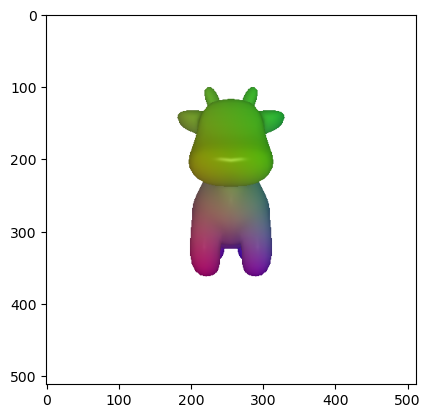

In [40]:
image = renderer(meshes, cameras=cameras, lights=lights)
plt.imshow(image[0].cpu().numpy())

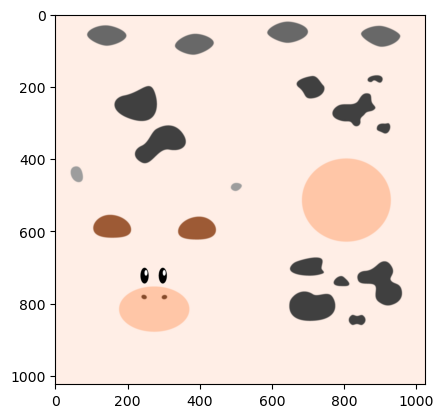

In [41]:
vertices, face_props, text_props = pytorch3d.io.load_obj("data/cow.obj")
faces = face_props.verts_idx
vertices = vertices.unsqueeze(0)
faces = faces.unsqueeze(0)
verts_uvs = text_props.verts_uvs
faces_uvs = face_props.textures_idx

texture_map = plt.imread("data/cow_texture.png")
plt.imshow(texture_map)

# texture is defined by vertices and faces and the image below has the same number of datapoints as the vertices

In [42]:
textures_uv = pytorch3d.renderer.TexturesUV(
    maps=torch.tensor([texture_map]),
    faces_uvs=faces_uvs.unsqueeze(0),
    verts_uvs=verts_uvs.unsqueeze(0),
).to(device)

/tmp/ipykernel_102980/2245936011.py:2: UserWarning:

Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)



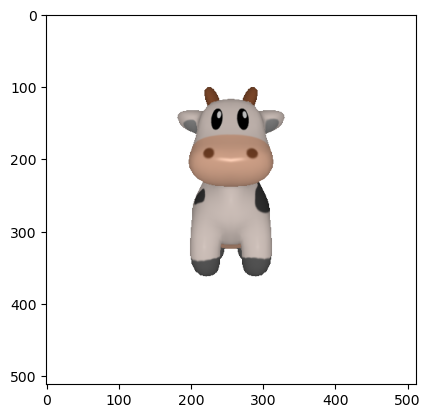

In [43]:
meshes.textures = textures_uv
image = renderer(meshes, cameras=cameras, lights=lights)
plt.imshow(image[0].cpu().numpy())

## Rendering Pointclouds

We will need:

* A point cloud
* A camera
* A point renderer

### Setting up Point Cloud

In [44]:
coords = torch.randn(1000, 3)
rgb = torch.ones_like(coords) * torch.tensor([0.7, 0.7, 1])

print("Coords:", coords.shape)
print("RGB:", rgb.shape)

Coords: torch.Size([1000, 3])
RGB: torch.Size([1000, 3])


In [45]:
pointcloud = pytorch3d.structures.Pointclouds(
    points=coords.unsqueeze(0),
    features=rgb.unsqueeze(0),
).to(device)

In [46]:
renderer = starter.utils.get_points_renderer(device=device, radius=0.03)

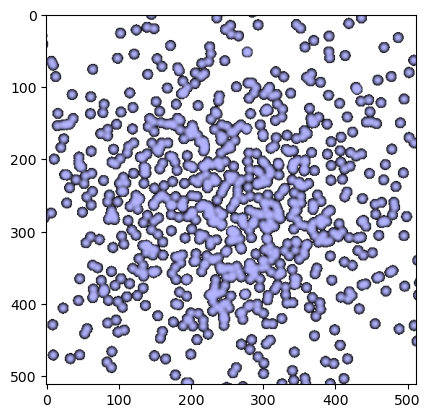

In [47]:
image = renderer(pointcloud, cameras=cameras)
plt.imshow(image[0].cpu())

In [48]:
plot_scene({
    "Pointcloud": {
        "Pointcloud": pointcloud,
        "Camera": cameras,
    },
})

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': [rgb(178, 178, 255), rgb(178, 178, 255),
                                   rgb(178, 178, 255), ..., rgb(178, 178, 255),
                                   rgb(178, 178, 255), rgb(178, 178, 255)],
                         'size': 1},
              'mode': 'markers',
              'name': 'Pointcloud',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([ 1.0312026 , -0.2694202 , -0.5436422 , ...,  0.04882922, -0.66828865,
                           0.99927163], dtype=float32),
              'y': array([ 0.31233793,  0.14485583,  0.10873798, ..., -2.077138  , -0.3978918 ,
                          -2.6163404 ], dtype=float32),
              'z': array([-0.13262548,  0.25716192, -0.7560952 , ...,  0.5301403 , -0.19490662,
                          -0.5235257 ], dtype=float32)},
             {'marker': {'size': 1},
              'name': 'Camera',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([-0.30000001,  0.        ,  0.        ,  0.        ,  0.30000001,
                           0.30000001, -0.30000001, -0.30000001,  0.        ,  0.30000001,
                           0.30000001,  0.        , -0.30000001,  0.        ,  0.        ]),
              'y': array([ 0.22500001,  0.22500001,  0.30000001,  0.22500001,  0.22500001,
                          -0.22500001, -0.22500001,  0.22500001,  0.        ,  0.22500001,
                          -0.22500001,  0.        , -0.22500001,  0.        ,  0.        ]),
              'z': array([-2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001,
                          -2.4000001, -2.4000001, -3.       , -2.4000001, -2.4000001, -3.       ,
                          -2.4000001, -3.       , -2.0999999])}],
    'layout': {'annotations': [{'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Pointcloud',
                                'x': 0.5,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'}],
               'scene': {'aspectmode': 'cube',
                         'camera': {'up': {'x': 0.0, 'y': 1.0, 'z': 0.0}},
                         'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
                         'xaxis': {'backgroundcolor': '#fff',
                                   'range': [-7.2527337074279785,
                                             7.164645671844482],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                                   'zeroline': False},
                         'yaxis': {'backgroundcolor': '#fff',
                                   'range': [-7.304490566253662,
                                             7.112888813018799],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                                   'zeroline': False},
                         'zaxis': {'backgroundcolor': '#fff',
                                   'range': [-7.184764862060547,
                                             7.232614517211914],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                        

In [49]:
rgb = coords.clone()
rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min())

pointcloud = pytorch3d.structures.Pointclouds(
    points=coords.unsqueeze(0),
    features=rgb.unsqueeze(0),
).to(device)

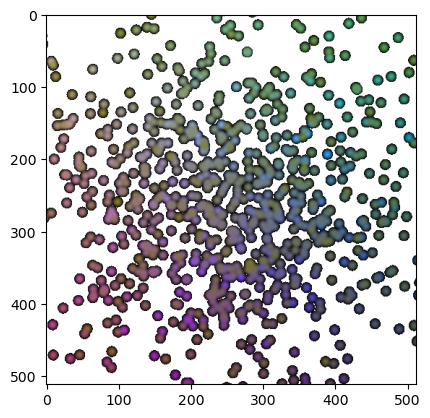

In [50]:
image = renderer(pointcloud, cameras=cameras)
plt.imshow(image[0].cpu())

### Rendering Parametric Functions

Equation of a sphere with radius $r$ with center $(x_0, y_0, z_0)$:

$$x = x_0 + r * \sin \theta \cos\phi$$
$$y = y_0 + r * \cos \theta $$
$$z = z_0 + r * \sin\theta \sin\phi$$

In [51]:
num_samples = 1000
r = 1
x_0 = 0
y_0 = 0
z_0 = 0

phi = torch.linspace(0, 2 * np.pi, num_samples)
theta = torch.linspace(0, 2 * np.pi, num_samples)
Phi, Theta = torch.meshgrid(phi, theta, indexing="ij")

print("Phi", Phi.shape)
print("Theta", Theta.shape)

Phi torch.Size([1000, 1000])
Theta torch.Size([1000, 1000])


In [52]:
x = x_0 + r * torch.sin(Theta) * torch.cos(Phi)
y = y_0 + r * torch.cos(Theta)
z = z_0 + r * torch.sin(Theta) * torch.sin(Phi)

In [53]:
points = torch.stack((x.flatten(), y.flatten(), z.flatten()), dim=1)
color = (points - points.min()) / (points.max() - points.min())

sphere_point_cloud = pytorch3d.structures.Pointclouds(
    points=[points], features=[color], # notice [points] can be a list of tensors like [points1, points2]
).to(device)

In [54]:
renderer = starter.utils.get_points_renderer(radius=0.01)

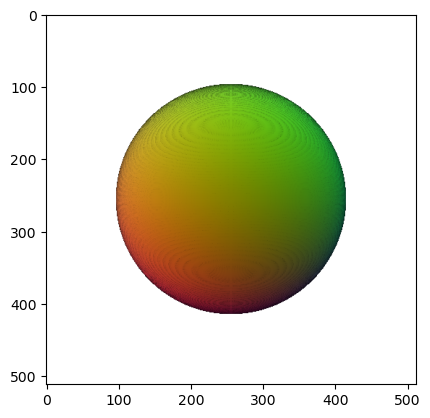

In [55]:
image = renderer(sphere_point_cloud, cameras=cameras)
plt.imshow(image[0].cpu())

In [56]:
plot_scene({
    "Pointcloud": {
        "Pointcloud": sphere_point_cloud,
        "Camera": cameras,
    },
})

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': [rgb(129, 48, 227), rgb(46, 192, 201), rgb(120,
                                   12, 72), ..., rgb(187, 239, 126), rgb(4, 133,
                                   161), rgb(87, 79, 238)],
                         'size': 1},
              'mode': 'markers',
              'name': 'Pointcloud',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([ 0.01604274, -0.6365935 , -0.05114361, ...,  0.4710225 , -0.96250695,
                          -0.3100982 ], dtype=float32),
              'y': array([-0.61961865,  0.5081479 , -0.9005786 , ...,  0.8820602 ,  0.04872444,
                          -0.3757727 ], dtype=float32),
              'z': array([ 0.784739  ,  0.58011585, -0.4316741 , ..., -0.01037034,  0.266845  ,
                           0.87328917], dtype=float32)},
             {'marker': {'size': 1},
              'name': 'Camera',
              'scene': 'scene',
              'type': 'scatter3d',
              'x': array([-0.30000001,  0.        ,  0.        ,  0.        ,  0.30000001,
                           0.30000001, -0.30000001, -0.30000001,  0.        ,  0.30000001,
                           0.30000001,  0.        , -0.30000001,  0.        ,  0.        ]),
              'y': array([ 0.22500001,  0.22500001,  0.30000001,  0.22500001,  0.22500001,
                          -0.22500001, -0.22500001,  0.22500001,  0.        ,  0.22500001,
                          -0.22500001,  0.        , -0.22500001,  0.        ,  0.        ]),
              'z': array([-2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001, -2.4000001,
                          -2.4000001, -2.4000001, -3.       , -2.4000001, -2.4000001, -3.       ,
                          -2.4000001, -3.       , -2.0999999])}],
    'layout': {'annotations': [{'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Pointcloud',
                                'x': 0.5,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'}],
               'scene': {'aspectmode': 'cube',
                         'camera': {'up': {'x': 0.0, 'y': 1.0, 'z': 0.0}},
                         'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
                         'xaxis': {'backgroundcolor': '#fff',
                                   'range': [-2.001633644104004,
                                             1.9983564615249634],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                                   'zeroline': False},
                         'yaxis': {'backgroundcolor': '#fff',
                                   'range': [-1.9945136308670044,
                                             2.005476474761963],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                                   'zeroline': False},
                         'zaxis': {'backgroundcolor': '#fff',
                                   'range': [-3.4000003337860107,
                                             2.001110315322876],
                                   'showaxeslabels': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'showticklabels': False,
                                   'ticks': '',
                              